# Import libraries

In [1]:
import os
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm

import seaborn as sns

from tqdm import tqdm

In [2]:
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 50)

In [3]:
path_to_save = './../results/02a_spectral_ranges'

# Loading data

In [4]:
path_to_ftir_data= './../data/preprocessed_data/scaled_data'
path_to_samples_description = './../data/parsed_data/samples_description.csv'

## FTIR-spectra (*scaled*)

In [5]:
files = os.listdir(path_to_ftir_data)

In [6]:
data_scaled_ranges = {}

for file in files:
    startswith_ftir_flg = file.startswith("ftir")

    if not startswith_ftir_flg:
        continue
    
    high_boundary = int(file.split('_')[-2])
    low_boundary = int(file.split('_')[-1].split('.')[0])

    wn_range = (high_boundary, low_boundary)
    tmp_data = pd.read_csv(f'{path_to_ftir_data}/{file}', sep=';', index_col=0)
    tmp_data.columns = tmp_data.columns.astype(float)

    data_scaled_ranges[wn_range] = tmp_data

    print(
        f'-' * 224,
        f'WAVENUMBER RANGE: {wn_range}',
        f'(*) data set shape: {data_scaled_ranges[wn_range].shape}',
        f'(*) Wavenumber for data (max/min): {round(data_scaled_ranges[wn_range].columns.max()), round(data_scaled_ranges[wn_range].columns.min())}',
        sep='\n'
    )

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WAVENUMBER RANGE: (1800, 1500)
(*) data set shape: (74, 311)
(*) Wavenumber for data (max/min): (1800, 1501)
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WAVENUMBER RANGE: (1500, 1300)
(*) data set shape: (74, 207)
(*) Wavenumber for data (max/min): (1500, 1301)
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WAVENUMBER RANGE: (3800, 2500)
(*) data set shape: (74, 1348)
(*) Wavenumber for data (max/min): (3800, 250

## Samples description

In [7]:
samples_description = pd.read_csv(f'{path_to_samples_description}', sep=';', index_col=0)

print(samples_description.shape)
samples_description.head(3)

(74, 6)


,Row_ID,Division,Size,Fraction_hue,Fraction_grouped_hue,Class
division_1_size_bulk,1,1,bulk,$> 0$,$d > 5$,2
division_1_size_5,2,1,5,$< 5$,$2 < d \leq 5$,1
division_1_size_3,3,1,3,$< 3$,$2 < d \leq 5$,1


# Spectral ranges analysis

In [8]:
sns.set_theme()

## Base variables

In [9]:
divisions_lst = sorted(samples_description['Division'].unique())
print(divisions_lst)

[np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10)]


In [10]:
X_LABEL_FONT_SIZE = 14
Y_LABEL_FONT_SIZE = 14

X_TICK_FONT_SIZE = 12
Y_TICK_FONT_SIZE = 12

LEGEND_TITLE_FONT_SIZE = 12
LEGEND_FONT_SIZE = 12

TITLE_FONT_SIZE = 16

## Base functions

### Spectra plotting

In [11]:
def plot_spectra(data_vis, ax, samples_description=None, hue_column=None, style_params=None, plot_params=None, legend_params=None):
    if style_params is None:
        style_params = {
            "X_LABEL_FONT_SIZE": 14,
            "Y_LABEL_FONT_SIZE": 14,
            "X_TICK_FONT_SIZE": 12,
            "Y_TICK_FONT_SIZE": 12,
            "TITLE_FONT_SIZE": 16,
        }
    
    if plot_params is None:
        plot_params = {
            "X_LABEL": 'Волновое число, см$^{-1}$',
            "Y_LABEL": '$A$',
            "TITLE": '',
            "Y_LABELPAD": 5,
            "X_LABELPAD": 5,
            "X_NBINS": 12,
            "Y_NBINS": 12,
            "X_STEP": None,
            "Y_STEP": None,
            "LINEWIDTH": 2.5,
            "ALPHA": 0.8,
            "COLORMAP": 'bwr'
        }

    if legend_params is None:
        legend_params = {
            "TITLE": 'Тип размерной фракции, мкм',
            "LOC": 'best',
            "NCOL": 3,
            "FONTSIZE": 12,
            "TITLE_FONTSIZE": 14
        }

    if samples_description is not None and hue_column is not None:
        hue_values = samples_description.loc[data_vis.index, hue_column].astype(str)
        unique_hue_values = hue_values.unique()
        colors = cm.get_cmap(plot_params["COLORMAP"])(np.linspace(0.2, 1.0, len(unique_hue_values)))
        color_map = dict(zip(unique_hue_values, colors))

        plot_data = [(fraction, hue_values[fraction], color_map[hue_values[fraction]]) for fraction in data_vis.index]
    else:
        fractions_sorted = sorted(
            data_vis.index,
            key=lambda x: float(x.split('_')[-1].replace('bulk', '1000')),
            reverse=True
        )
        colors = cm.get_cmap(plot_params["COLORMAP"])(np.linspace(0.2, 1.0, len(fractions_sorted)))
        labels = [f'$> 0$' if frac.split('_')[-1] == 'bulk' else f'$< {frac.split("_")[-1]}$' for frac in fractions_sorted]
        plot_data = zip(fractions_sorted, labels, colors)

    seen_labels = set()
    for fraction, label, color in plot_data:
        legend_label = label if label not in seen_labels else None
        seen_labels.add(label)

        ax.plot(
            data_vis.columns,
            data_vis.loc[fraction],
            label=legend_label,
            alpha=plot_params["ALPHA"],
            color=color,
            linewidth=plot_params["LINEWIDTH"]
        )

    ax.set_title(plot_params["TITLE"], fontsize=style_params["TITLE_FONT_SIZE"], fontstyle='italic')
    
    ax.set_xlabel(plot_params['X_LABEL'], fontsize=style_params["X_LABEL_FONT_SIZE"], labelpad=plot_params["X_LABELPAD"])
    ax.set_ylabel(plot_params['Y_LABEL'], fontsize=style_params["Y_LABEL_FONT_SIZE"], labelpad=plot_params["Y_LABELPAD"], rotation=0)
    
    ax.tick_params(axis='x', labelsize=style_params["X_TICK_FONT_SIZE"])
    ax.tick_params(axis='y', labelsize=style_params["Y_TICK_FONT_SIZE"])

    if plot_params["X_STEP"] is None:
        ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=plot_params["X_NBINS"]))
    else:
        ax.xaxis.set_major_locator(ticker.MultipleLocator(plot_params["X_STEP"]))
    
    if plot_params["Y_STEP"] is None:
        ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=plot_params["Y_NBINS"]))
    else:
        ax.yaxis.set_major_locator(ticker.MultipleLocator(plot_params["Y_STEP"]))

    ax.invert_xaxis()

    ax.legend(
        title=legend_params["TITLE"],
        loc=legend_params["LOC"],
        ncol=legend_params["NCOL"],
        title_fontsize=legend_params["TITLE_FONTSIZE"],
        fontsize=legend_params["FONTSIZE"]
    )

### Creating annotation

In [12]:
def add_annotation(ax, text, xy=(0.013, 0.98), fontsize=12, facecolor='white', edgecolor='black', alpha=0.5):
    ax.annotate(
        text=text,
        xy=xy,
        xycoords='axes fraction',
        fontsize=fontsize,
        fontweight='bold',
        color='black',
        ha='left',
        va='top',
        bbox={
            'facecolor': facecolor,
            'edgecolor': edgecolor,
            'boxstyle': 'round',
            'alpha': alpha
        }
    )

## Spectra visualization in different regions

*Config-features for visualization*

In [13]:
custom_plot_params = {
    'X_LABEL': 'Волновое число, см$^{-1}$',
    'Y_LABEL': '$A_{n}$',
    'TITLE': '',
    'Y_LABELPAD': 15,
    'X_LABELPAD': 5,
    'X_NBINS': 10,
    'Y_NBINS': 12,
    'X_STEP': 100,
    'Y_STEP': None,
    'LINEWIDTH': 4.0,
    'ALPHA': 0.9,
    'COLORMAP': 'bwr'  # bwr, viridis, twilight, inferno, coolwarm
}

custom_style = {
    'Y_LABEL_FONT_SIZE': 16,
    'X_LABEL_FONT_SIZE': 16,
    'X_TICK_FONT_SIZE': 14,
    'Y_TICK_FONT_SIZE': 14,
    'TITLE_FONT_SIZE': 18,
}

custom_legend = {
    'TITLE': '',  # Размерная фракция, мкм
    'LOC': 'upper right',
    'NCOL': 1,
    'FONTSIZE': 12,
    'TITLE_FONTSIZE': 14
}


### 3800–2500, 1900-800 cm$^{-1}$

In [14]:
ranges_lst = [
    (3800, 2500),
    (1900, 800)
]

10it [00:00, 129.84it/s]


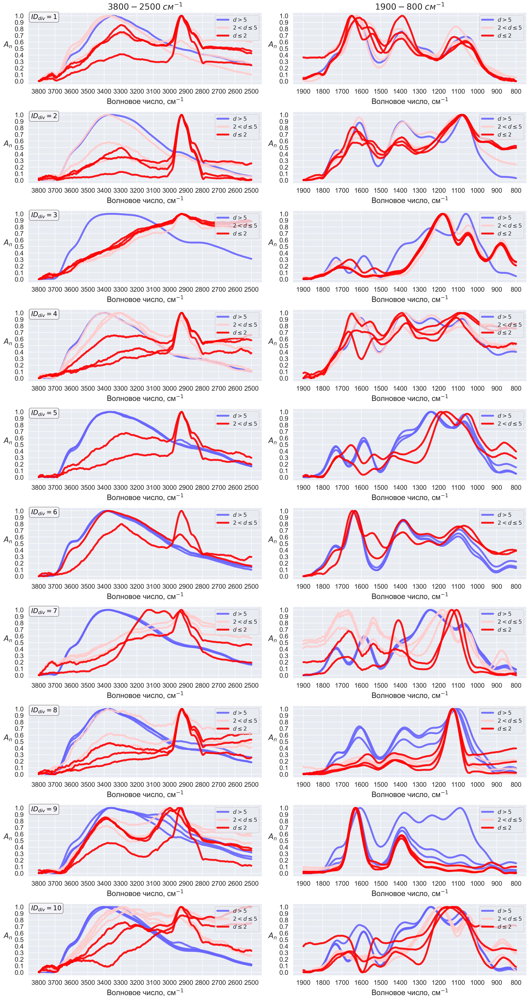

In [15]:
nrows = len(divisions_lst)
ncols = 2

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 8, nrows * 3), dpi=300)

for i, division in tqdm(enumerate(divisions_lst)):
    # Selecting index for current division
    idx_lst = samples_description.loc[samples_description['Division'] == division].index

    # Visualization
    for j, wn_range in enumerate(ranges_lst):

        tmp_data_vis = data_scaled_ranges[wn_range].loc[idx_lst]

        if i > 0:
            custom_plot_params["TITLE"] = ''
        else:
            custom_plot_params["TITLE"] = f'${wn_range[0]}-{wn_range[1]}$' + ' $см^{-1}$'
        
        plot_spectra(
            data_vis=tmp_data_vis,
            ax=axes[i][j],
            samples_description=samples_description,
            hue_column='Fraction_grouped_hue',  # Fraction_hue, Fraction_grouped_hue
            plot_params=custom_plot_params,
            style_params=custom_style,
            legend_params=custom_legend
        )

    # Creating annotation
    add_annotation(
        ax=axes[i, 0],
        text='$ID_{div}' + f' = {division}$',
        xy=(0.013, 0.98),
        fontsize=TITLE_FONT_SIZE - 2
    )
    

plt.tight_layout()

# plt.savefig(f'{path_to_save}/scaled_spectra_ranges_3800_2500_1800_900.png', dpi=600)

plt.show()

### 1800–1500, 1500-1300, 1300-900 cm$^{-1}$

In [16]:
custom_plot_params['X_STEP'] = 50

In [17]:
ranges_lst = [
    (1800, 1500),
    (1500, 1300),
    (1300, 900)
]

10it [00:00, 89.42it/s]


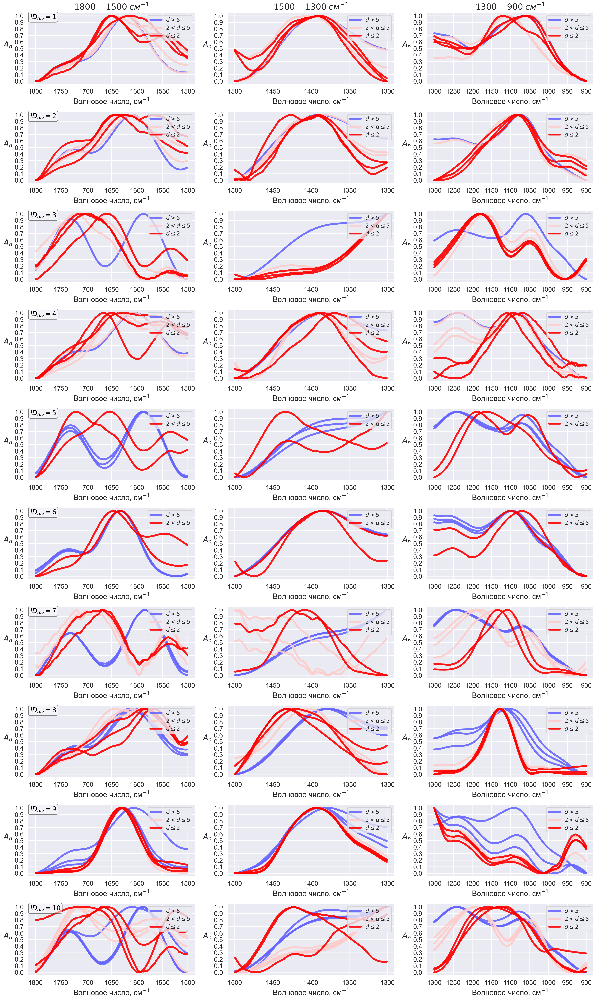

In [18]:
nrows = len(divisions_lst)
ncols = 3

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 6, nrows * 3), dpi=300)

for i, division in tqdm(enumerate(divisions_lst)):
    # Selecting index for current division
    idx_lst = samples_description.loc[samples_description['Division'] == division].index

    # Visualization
    for j, wn_range in enumerate(ranges_lst):

        tmp_data_vis = data_scaled_ranges[wn_range].loc[idx_lst]

        if i > 0:
            custom_plot_params["TITLE"] = ''
        else:
            custom_plot_params["TITLE"] = f'${wn_range[0]}-{wn_range[1]}$' + ' $см^{-1}$'
        
        plot_spectra(
            data_vis=tmp_data_vis,
            ax=axes[i][j],
            samples_description=samples_description,
            hue_column='Fraction_grouped_hue',  # Fraction_hue, Fraction_grouped_hue
            plot_params=custom_plot_params,
            style_params=custom_style,
            legend_params=custom_legend
        )

    # Creating annotation
    add_annotation(
        ax=axes[i, 0],
        text='$ID_{div}' + f' = {division}$',
        xy=(0.013, 0.98),
        fontsize=TITLE_FONT_SIZE - 2
    )
    

plt.tight_layout()

# plt.savefig(f'{path_to_save}/scaled_spectra_ranges_1800_1500_1500_1300_1300_900.png', dpi=600)

plt.show()

### Spectra visualization in ranges 3800-2500, 1900-800 cm$^{-1}$ ($ID_{div} = 8, 9, 10$)

*Config-features for visualization*

In [19]:
custom_plot_params = {
    'X_LABEL': 'Волновое число, см$^{-1}$',
    'Y_LABEL': '$A_{n}$',
    'TITLE': '',
    'Y_LABELPAD': 15,
    'X_LABELPAD': 5,
    'X_NBINS': 8,
    'Y_NBINS': 12,
    'X_STEP': 100,
    'Y_STEP': None,
    'LINEWIDTH': 4.0,
    'ALPHA': 0.9,
    'COLORMAP': 'bwr'  # bwr, viridis, twilight, inferno, coolwarm
}

custom_style = {
    'Y_LABEL_FONT_SIZE': 18,
    'X_LABEL_FONT_SIZE': 18,
    'X_TICK_FONT_SIZE': 16,
    'Y_TICK_FONT_SIZE': 16,
    'TITLE_FONT_SIZE': 18,
}

custom_legend = {
    'TITLE': 'Размерная фракции, мкм',  # Размерная фракция, мкм
    'LOC': 'upper right',
    'NCOL': 1,
    'FONTSIZE': 12,
    'TITLE_FONTSIZE': 14
}

*Spectra visualization*

In [20]:
ranges_lst = [
    (3800, 2500),
    (1900, 800)
]

#### *Division №8*

2it [00:00, 278.08it/s]


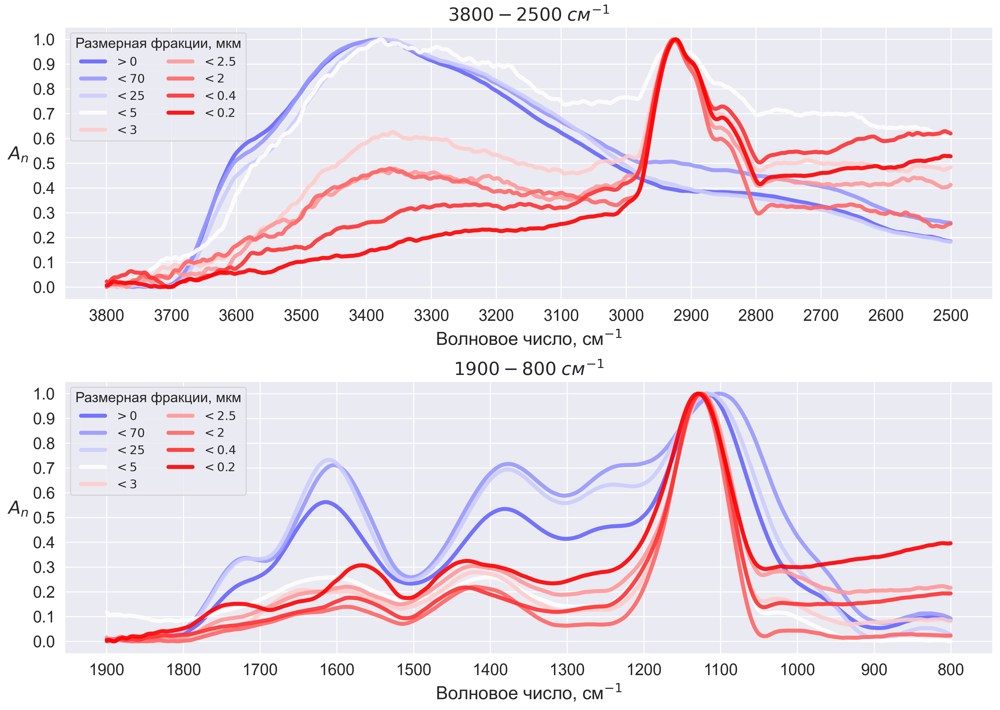

In [21]:
custom_legend['NCOL'] = 2
custom_legend['LOC'] = 'upper left'

nrows = 2
ncols = 1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 10), dpi=300)

idx_lst = samples_description.loc[samples_description['Division'] == 8].index

for j, wn_range in tqdm(enumerate(ranges_lst)):

    tmp_data_vis = data_scaled_ranges[wn_range].loc[idx_lst]

    custom_plot_params["TITLE"] = f'${wn_range[0]}-{wn_range[1]}$' + ' $см^{-1}$'
    
    plot_spectra(
        data_vis=tmp_data_vis,
        ax=axes[j],
        samples_description=samples_description,
        hue_column='Fraction_hue',  # Fraction_hue, Fraction_grouped_hue
        plot_params=custom_plot_params,
        style_params=custom_style,
        legend_params=custom_legend
    )

plt.tight_layout()

plt.savefig(f'{path_to_save}/scaled_spectra_3800_2500_1900_800_div_8_hue.png', dpi=600)

plt.show()

#### *Division №9*

2it [00:00, 225.33it/s]


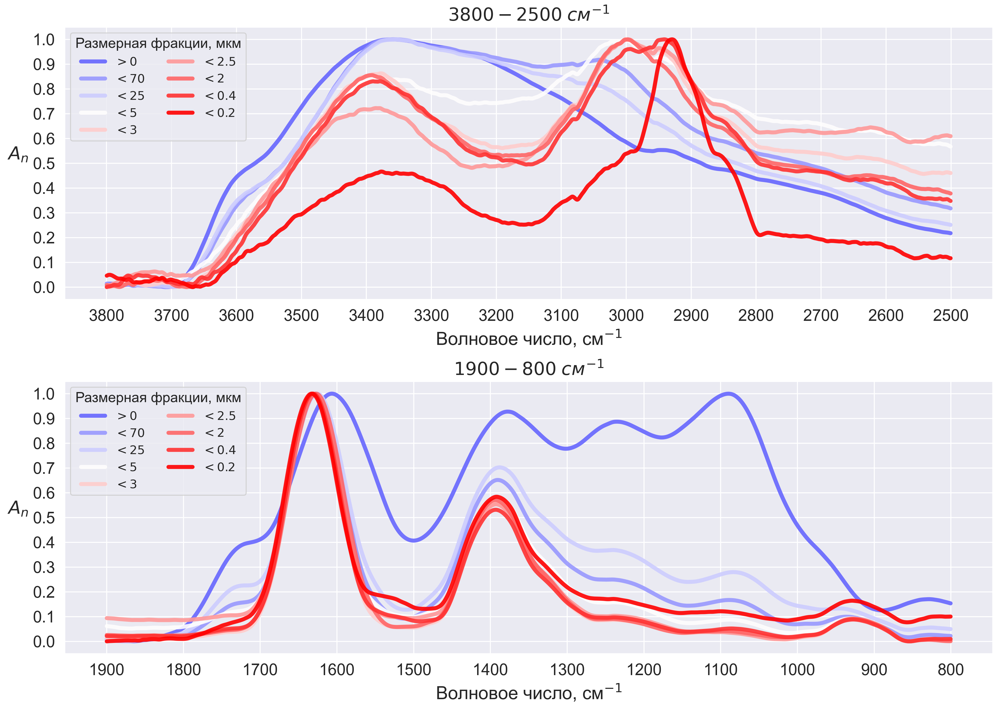

In [22]:
custom_legend['NCOL'] = 2
custom_legend['LOC'] = 'upper left'

nrows = 2
ncols = 1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 10), dpi=300)

idx_lst = samples_description.loc[samples_description['Division'] == 9].index

for j, wn_range in tqdm(enumerate(ranges_lst)):

    tmp_data_vis = data_scaled_ranges[wn_range].loc[idx_lst]

    custom_plot_params["TITLE"] = f'${wn_range[0]}-{wn_range[1]}$' + ' $см^{-1}$'
    
    plot_spectra(
        data_vis=tmp_data_vis,
        ax=axes[j],
        samples_description=samples_description,
        hue_column='Fraction_hue',  # Fraction_hue, Fraction_grouped_hue
        plot_params=custom_plot_params,
        style_params=custom_style,
        legend_params=custom_legend
    )

plt.tight_layout()

plt.savefig(f'{path_to_save}/scaled_spectra_3800_2500_1900_800_div_9_hue.png', dpi=600)

plt.show()

#### *Division №10*

2it [00:00, 221.46it/s]


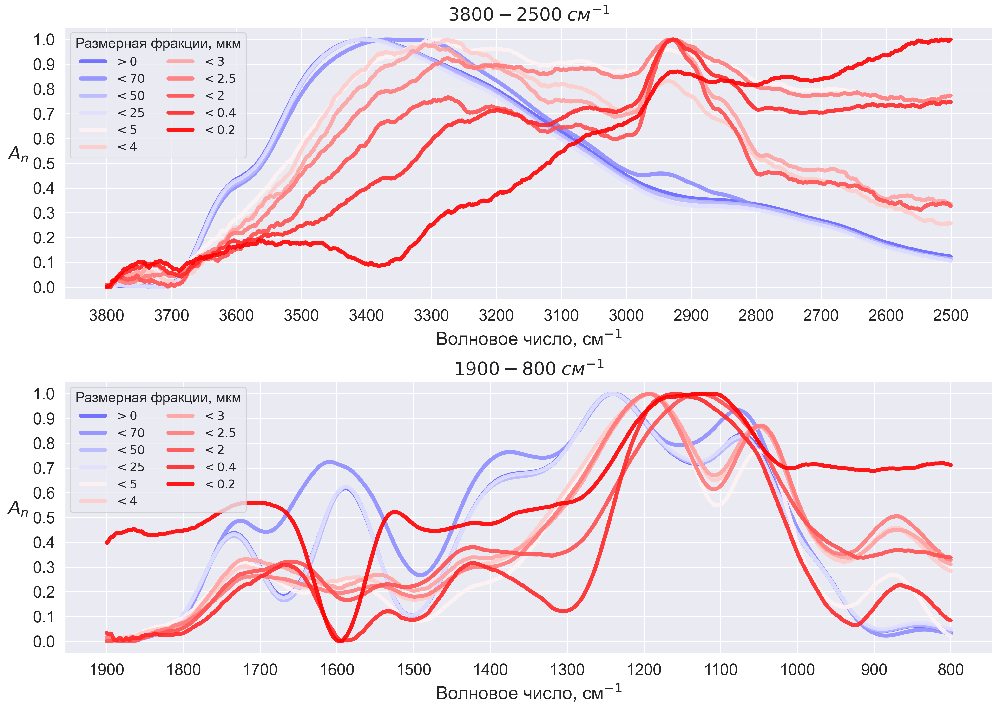

In [23]:
custom_legend['NCOL'] = 2
custom_legend['LOC'] = 'upper left'

nrows = 2
ncols = 1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 10), dpi=300)

idx_lst = samples_description.loc[samples_description['Division'] == 10].index

for j, wn_range in tqdm(enumerate(ranges_lst)):

    tmp_data_vis = data_scaled_ranges[wn_range].loc[idx_lst]

    custom_plot_params["TITLE"] = f'${wn_range[0]}-{wn_range[1]}$' + ' $см^{-1}$'
    
    plot_spectra(
        data_vis=tmp_data_vis,
        ax=axes[j],
        samples_description=samples_description,
        hue_column='Fraction_hue',  # Fraction_hue, Fraction_grouped_hue
        plot_params=custom_plot_params,
        style_params=custom_style,
        legend_params=custom_legend
    )

plt.tight_layout()

plt.savefig(f'{path_to_save}/scaled_spectra_3800_2500_1900_800_div_10_hue.png', dpi=600)

plt.show()